##### Figure 2 TF Analysis (currently Fig 3)
## Uses Nov Version2d object
## and Ensembl Id TF's

### Nov 15,  2024
#### added MYF5 to stem cell heatmap


## General Import Functions

In [1]:
import tspex
import pandas as pd
import scipy.stats as stats
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import anndata as an

In [2]:
DATA_IN_DIR = '/Users/bob/Documents/TFanalysisManuscriptWrap11-11-2024/'
DATA_OUT_DIR = '/Users/bob/Documents/TFanalysisManuscriptWrap11-11-2024/'  
TFxCT_DATA = 'TSP1_30_by_CellType_Full_Version2d_Nov2024_LogNorm_10XOnly_Mean_TFonly.csv'
META_DATA  = 'TSP1_30_version2d_10X_SS_2024_11_12_metadata_CLEAN_TFonly.csv'
COLOR_TABLE = 'CellTypeColorPalettes.csv'

In [3]:
# Now read in mean
print(DATA_IN_DIR+TFxCT_DATA)
TF_df = pd.read_csv(DATA_IN_DIR+TFxCT_DATA, index_col = 0)
TF_df.shape

/Users/bob/Documents/TFanalysisManuscriptWrap11-11-2024/TSP1_30_by_CellType_Full_Version2d_Nov2024_LogNorm_10XOnly_Mean_TFonly.csv


(175, 1637)

In [4]:
# remove zeros and sort for looks
TF_exp_all = TF_df.T
TF_exp = TF_exp_all[TF_exp_all.sum(axis = 1) != 0.0]
TF_exp = TF_exp.sort_index(axis=0).sort_index(axis=1)
TF_exp

,acinar_cell,acinar_cell_of_salivary_gland,activated_cd4_positive__alpha_beta_t_cell,activated_cd8_positive__alpha_beta_t_cell,adventitial_cell,alveolar_type_2_fibroblast_cell,b_cell,basal_cell,basal_cell_of_prostate_epithelium,basophil,...,transit_amplifying_cell_of_small_intestine,tuft_cell_of_colon,type_b_pancreatic_cell,type_i_pneumocyte,type_ii_pneumocyte,type_l_enteroendocrine_cell,vascular_associated_smooth_muscle_cell,vein_endothelial_cell,ventricular_cardiac_muscle_cell,vestibular_dark_cell
ADNP,0.046193,0.333551,0.513674,0.626556,0.378455,0.465089,0.608835,0.655836,0.763171,0.359936,...,0.492757,0.417895,0.340732,0.625163,0.450006,0.716034,0.447129,0.447148,0.427005,0.651063
ADNP2,0.009876,0.140091,0.325864,0.321171,0.193175,0.238748,0.161301,0.242889,0.258735,0.153731,...,0.317310,0.056905,0.075665,0.222563,0.266650,0.303473,0.338442,0.215884,0.161118,0.353341
AEBP1,0.006193,0.004961,0.002443,0.000000,1.288871,0.897549,0.034027,0.036436,0.011981,0.028147,...,0.000000,0.000000,0.000836,0.005759,0.000282,0.000000,0.489091,0.062086,0.226796,0.030797
AEBP2,0.044363,0.449820,0.424162,0.436206,0.402605,0.664268,0.411909,0.595855,0.641190,0.380733,...,0.160975,0.388699,0.353021,0.259166,0.384250,0.363918,0.456358,0.373508,0.266055,0.536432
AHCTF1,0.019100,0.169921,0.315120,0.399694,0.438465,0.657056,0.378615,0.370374,0.298039,0.209078,...,0.268948,0.177442,0.186194,0.352844,0.242891,0.372240,0.448918,0.450153,0.166566,0.512690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZUP1,0.013551,0.043735,0.103288,0.139597,0.052359,0.032110,0.101960,0.092021,0.068077,0.063663,...,0.114799,0.089140,0.068827,0.084671,0.058728,0.079277,0.069017,0.087533,0.072503,0.140442
ZXDA,0.003665,0.007353,0.017801,0.020734,0.025428,0.022213,0.023666,0.017546,0.043380,0.020668,...,0.000000,0.008480,0.012849,0.019685,0.015708,0.036805,0.013482,0.025795,0.012939,0.038980
ZXDB,0.005427,0.018930,0.023318,0.017984,0.019682,0.026839,0.028418,0.031522,0.055306,0.013583,...,0.000000,0.033494,0.029991,0.041763,0.029279,0.025711,0.022962,0.036770,0.026582,0.050892
ZXDC,0.016650,0.226819,0.277453,0.276433,0.268865,0.330379,0.272625,0.324864,0.456630,0.233024,...,0.271677,0.181578,0.198911,0.486634,0.384730,0.276657,0.189008,0.284826,0.178414,0.209109


In [5]:
TF_exp.max()

acinar_cell                                  3.552263
acinar_cell_of_salivary_gland                1.948259
activated_cd4_positive__alpha_beta_t_cell    3.144448
activated_cd8_positive__alpha_beta_t_cell    3.071112
adventitial_cell                             2.628517
                                               ...   
type_l_enteroendocrine_cell                  2.623273
vascular_associated_smooth_muscle_cell       2.487375
vein_endothelial_cell                        2.487201
ventricular_cardiac_muscle_cell              2.555397
vestibular_dark_cell                         2.346420
Length: 175, dtype: float64

In [6]:
TF_exp.min()

acinar_cell                                  0.0
acinar_cell_of_salivary_gland                0.0
activated_cd4_positive__alpha_beta_t_cell    0.0
activated_cd8_positive__alpha_beta_t_cell    0.0
adventitial_cell                             0.0
                                            ... 
type_l_enteroendocrine_cell                  0.0
vascular_associated_smooth_muscle_cell       0.0
vein_endothelial_cell                        0.0
ventricular_cardiac_muscle_cell              0.0
vestibular_dark_cell                         0.0
Length: 175, dtype: float64

In [7]:
# just a check
#TF_exp.loc['GLI4', :].sort_values()

In [8]:
####################################################################
# Compute tau specificity value for each TF
####################################################################

tau_tso = pd.DataFrame()
tau_tso = tspex.TissueSpecificity(TF_exp, 'tau', log = False)
tau_values = tau_tso.tissue_specificity.sort_values(ascending = False)
print(DATA_OUT_DIR+'TauValues_'+ TFxCT_DATA)
tau_values.to_csv(DATA_OUT_DIR+'TauValues_'+ TFxCT_DATA)
tau_values

/Users/bob/Documents/TFanalysisManuscriptWrap11-11-2024/TauValues_TSP1_30_by_CellType_Full_Version2d_Nov2024_LogNorm_10XOnly_Mean_TFonly.csv


FOXD4L4    0.9999
FIGLA      0.9997
NEUROG1    0.9996
GSX2       0.9996
HOXC12     0.9995
            ...  
ZNF644     0.4596
ASH1L      0.4504
YY1        0.4344
BPTF       0.4321
SON        0.4001
Length: 1635, dtype: float64

In [9]:
print('Tau Max', tau_values.max())
print('Tau Min', tau_values.min())

Tau Max 0.9999
Tau Min 0.4001


In [10]:
tau_values.loc['SON']

0.4001

In [11]:
########## end of test code #######

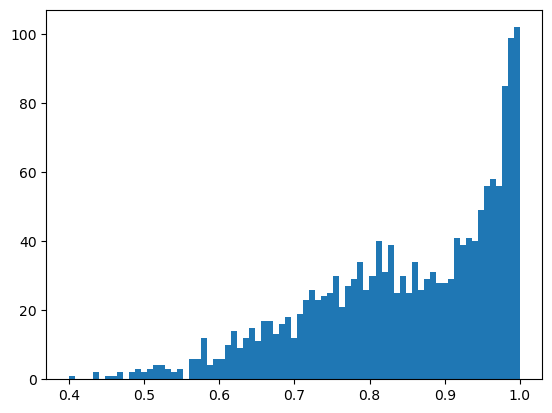

In [12]:
# distribution of Tau values has two peaks divided at 0.85 ???
# could add quantile normalization per Doug. Could argue ubiquitous is 0.54 and below.
fig = plt.hist(tau_values, bins = 75)
plt.savefig(DATA_OUT_DIR + 'TauDistribution.pdf')
plt.show(fig)

TGIF2LY      3
TGIF2LX      4
FOXB2        6
NEUROD6      6
FERD3L       7
          ... 
PHF21A     175
PIN1       175
RBPJ       175
RLF        175
NFIC       175
Length: 1635, dtype: int64

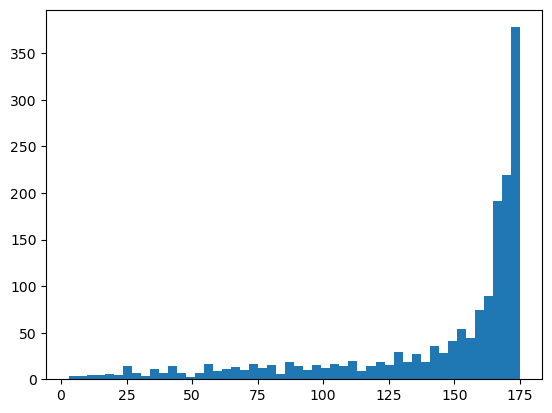

In [13]:
# look at genes in cell types 
TF_ctcount =  TF_exp.astype(bool).sum(axis=1).sort_values(ascending = True)
plt.hist(TF_ctcount, bins = 50)
TF_ctcount

## Only high tau or low tau

In [14]:
# break between ubiquitous and specific at 0.85 tau
# reconsider this after quantile normalization

low_tau = list(tau_values.index[tau_values <= 0.85])
hi_tau = list(tau_values.index[tau_values > 0.85])
TF_hi_exp = TF_exp.loc[hi_tau].copy()
TF_low_exp = TF_exp.loc[low_tau].copy()
print(len(TF_low_exp))
print(len((TF_hi_exp)))
print(len((TF_exp)))

745
890
1635


In [15]:
# save list of lowest 100 for figure
low100 = tau_values.sort_values(ascending = True).iloc[0:100]
low100df = pd.DataFrame(low100)
low100df.to_csv(DATA_OUT_DIR+'LowestTauTFs100.csv')
low100df

,0
SON,0.4001
BPTF,0.4321
YY1,0.4344
ASH1L,0.4504
ZNF644,0.4596
...,...
ZNF706,0.6229
ZNF44,0.6240
MTERF4,0.6242
KLF3,0.6253


## Now Make Heatmap. #####

In [16]:
def PrepColorTable(exp_matrix):
    
    # read metadata that goes with the full objects
    metadata = pd.read_csv(DATA_IN_DIR+META_DATA)
    metadata = metadata[metadata.method == '10X']

    # map broad cell types to celltypes for those types in exp_matrix
    ct = pd.DataFrame()
    ct['ctypes'] = metadata.cell_ontology_class
    ct['comparts'] = metadata.compartment
    ct['broadct'] = metadata.broad_cell_class

    ct = ct[ct.ctypes.isin(exp_matrix.columns)]
    ct = ct.drop_duplicates('ctypes')
    newindex = list(ct.ctypes)
    ct.index = newindex
    
    # map colors to the broad cell types
    colorlist = [matplotlib.colors.to_hex(c) for c in plt.cm.tab20.colors] + [matplotlib.colors.to_hex(c) for c in plt.cm.tab20b.colors]
    type_to_comp_dict = dict(zip(ct.broadct.unique(), colorlist))
    ct['col_colors'] = ct.broadct.map(type_to_comp_dict)
      
    return(ct)

In [17]:
TF_exp

,acinar_cell,acinar_cell_of_salivary_gland,activated_cd4_positive__alpha_beta_t_cell,activated_cd8_positive__alpha_beta_t_cell,adventitial_cell,alveolar_type_2_fibroblast_cell,b_cell,basal_cell,basal_cell_of_prostate_epithelium,basophil,...,transit_amplifying_cell_of_small_intestine,tuft_cell_of_colon,type_b_pancreatic_cell,type_i_pneumocyte,type_ii_pneumocyte,type_l_enteroendocrine_cell,vascular_associated_smooth_muscle_cell,vein_endothelial_cell,ventricular_cardiac_muscle_cell,vestibular_dark_cell
ADNP,0.046193,0.333551,0.513674,0.626556,0.378455,0.465089,0.608835,0.655836,0.763171,0.359936,...,0.492757,0.417895,0.340732,0.625163,0.450006,0.716034,0.447129,0.447148,0.427005,0.651063
ADNP2,0.009876,0.140091,0.325864,0.321171,0.193175,0.238748,0.161301,0.242889,0.258735,0.153731,...,0.317310,0.056905,0.075665,0.222563,0.266650,0.303473,0.338442,0.215884,0.161118,0.353341
AEBP1,0.006193,0.004961,0.002443,0.000000,1.288871,0.897549,0.034027,0.036436,0.011981,0.028147,...,0.000000,0.000000,0.000836,0.005759,0.000282,0.000000,0.489091,0.062086,0.226796,0.030797
AEBP2,0.044363,0.449820,0.424162,0.436206,0.402605,0.664268,0.411909,0.595855,0.641190,0.380733,...,0.160975,0.388699,0.353021,0.259166,0.384250,0.363918,0.456358,0.373508,0.266055,0.536432
AHCTF1,0.019100,0.169921,0.315120,0.399694,0.438465,0.657056,0.378615,0.370374,0.298039,0.209078,...,0.268948,0.177442,0.186194,0.352844,0.242891,0.372240,0.448918,0.450153,0.166566,0.512690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZUP1,0.013551,0.043735,0.103288,0.139597,0.052359,0.032110,0.101960,0.092021,0.068077,0.063663,...,0.114799,0.089140,0.068827,0.084671,0.058728,0.079277,0.069017,0.087533,0.072503,0.140442
ZXDA,0.003665,0.007353,0.017801,0.020734,0.025428,0.022213,0.023666,0.017546,0.043380,0.020668,...,0.000000,0.008480,0.012849,0.019685,0.015708,0.036805,0.013482,0.025795,0.012939,0.038980
ZXDB,0.005427,0.018930,0.023318,0.017984,0.019682,0.026839,0.028418,0.031522,0.055306,0.013583,...,0.000000,0.033494,0.029991,0.041763,0.029279,0.025711,0.022962,0.036770,0.026582,0.050892
ZXDC,0.016650,0.226819,0.277453,0.276433,0.268865,0.330379,0.272625,0.324864,0.456630,0.233024,...,0.271677,0.181578,0.198911,0.486634,0.384730,0.276657,0.189008,0.284826,0.178414,0.209109


In [18]:
TF_exp.loc['NFAT5',:]

acinar_cell                                  0.051434
acinar_cell_of_salivary_gland                0.689513
activated_cd4_positive__alpha_beta_t_cell    0.884371
activated_cd8_positive__alpha_beta_t_cell    0.840016
adventitial_cell                             0.835454
                                               ...   
type_l_enteroendocrine_cell                  1.044553
vascular_associated_smooth_muscle_cell       0.812850
vein_endothelial_cell                        1.120266
ventricular_cardiac_muscle_cell              0.442607
vestibular_dark_cell                         1.589082
Name: NFAT5, Length: 175, dtype: float64

In [19]:
# read metatdata that goes with the full objects
metadata = pd.read_csv(DATA_IN_DIR+META_DATA)
metadata = metadata[metadata.method == '10X']
set(metadata.cell_ontology_class.unique())

/var/folders/m0/j6jtv7p952z06h53qyn602540000gn/T/ipykernel_55113/2264182750.py:2: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata = pd.read_csv(DATA_IN_DIR+META_DATA)


{'acinar_cell',
 'acinar_cell_of_salivary_gland',
 'activated_cd4_positive__alpha_beta_t_cell',
 'activated_cd8_positive__alpha_beta_t_cell',
 'adventitial_cell',
 'alveolar_type_2_fibroblast_cell',
 'b_cell',
 'basal_cell',
 'basal_cell_of_prostate_epithelium',
 'basophil',
 'best4+_intestinal_epithelial_cell__human',
 'bladder_urothelial_cell',
 'blood_vessel_smooth_muscle_cell',
 'bronchial_smooth_muscle_cell',
 'capillary_endothelial_cell',
 'cardiac_endothelial_cell',
 'cd4_positive__alpha_beta_t_cell',
 'cd4_positive__alpha_beta_thymocyte',
 'cd8_positive__alpha_beta_t_cell',
 'cd8_positive__alpha_beta_thymocyte',
 'ciliated_columnar_cell_of_tracheobronchial_tree',
 'ciliated_epithelial_cell',
 'classical_monocyte',
 'club_cell',
 'colon_endothelial_cell',
 'colon_macrophage',
 'common_myeloid_progenitor',
 'conjunctival_epithelial_cell',
 'connective_tissue_cell',
 'corneal_epithelial_cell',
 'duct_epithelial_cell',
 'endothelial_cell',
 'endothelial_cell_of_arteriole',
 'endoth

In [20]:
TFcolors = PrepColorTable(TF_exp)
TFcolors.to_csv(DATA_IN_DIR+COLOR_TABLE)

/var/folders/m0/j6jtv7p952z06h53qyn602540000gn/T/ipykernel_55113/251749323.py:4: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata = pd.read_csv(DATA_IN_DIR+META_DATA)


In [21]:
# Reorder the celltype columns so in broad cell types order
ct_order = TFcolors.sort_values('broadct').index 
TFcolors = TFcolors.loc[ct_order]

ed = TF_exp.T

plot_data = ed.loc[ct_order].T
expr_data_plot = ed.loc[ct_order].T
expr_data_plot  # now the cell types are in order

,adventitial_cell,cardiac_endothelial_cell,ciliated_epithelial_cell,lung_ciliated_cell,ciliated_columnar_cell_of_tracheobronchial_tree,conjunctival_epithelial_cell,connective_tissue_cell,bronchial_smooth_muscle_cell,myometrial_cell,tongue_muscle_cell,...,regulatory_t_cell,naive_thymus_derived_cd8_positive__alpha_beta_t_cell,naive_thymus_derived_cd4_positive__alpha_beta_t_cell,activated_cd4_positive__alpha_beta_t_cell,activated_cd8_positive__alpha_beta_t_cell,gamma_delta_t_cell,mature_nk_t_cell,t_cell,bladder_urothelial_cell,vestibular_dark_cell
ADNP,0.378455,0.462867,0.466266,0.529221,0.565514,0.497125,0.488275,0.269635,0.479047,0.332385,...,0.443370,0.658961,0.467374,0.513674,0.626556,0.744589,0.632596,0.563665,0.488158,0.651063
ADNP2,0.193175,0.149852,0.211501,0.156244,0.131142,0.302681,0.131193,0.209486,0.319167,0.153276,...,0.178770,0.273635,0.208490,0.325864,0.321171,0.306895,0.198538,0.261537,0.372773,0.353341
AEBP1,1.288871,0.058844,0.000000,0.001837,0.008622,0.018560,1.058246,1.150609,0.397098,0.095480,...,0.012474,0.024131,0.027610,0.002443,0.000000,0.001482,0.012821,0.009060,0.000738,0.030797
AEBP2,0.402605,0.432417,0.541366,0.704556,0.884250,0.623117,0.344961,0.379561,0.417306,0.524837,...,0.431999,0.590181,0.420558,0.424162,0.436206,0.426247,0.464831,0.512912,0.470515,0.536432
AHCTF1,0.438465,0.341739,0.384281,0.263855,0.315227,0.403961,0.410665,0.281830,0.603726,0.450289,...,0.372696,0.497781,0.380999,0.315120,0.399694,0.502197,0.349160,0.421997,0.243048,0.512690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZUP1,0.052359,0.085695,0.064653,0.038909,0.044723,0.126376,0.082521,0.014417,0.081262,0.039798,...,0.104643,0.094121,0.075943,0.103288,0.139597,0.151083,0.103678,0.091516,0.088299,0.140442
ZXDA,0.025428,0.041596,0.016440,0.016072,0.007156,0.017882,0.011403,0.011148,0.021780,0.013748,...,0.025152,0.018684,0.023089,0.017801,0.020734,0.011486,0.015217,0.018603,0.030345,0.038980
ZXDB,0.019682,0.025298,0.034957,0.021111,0.014792,0.072183,0.048877,0.022416,0.060519,0.006791,...,0.030548,0.025371,0.031387,0.023318,0.017984,0.022325,0.021566,0.024238,0.092115,0.050892
ZXDC,0.268865,0.233248,0.253357,0.341233,0.357332,0.174508,0.283933,0.188956,0.238220,0.322207,...,0.238636,0.352388,0.283431,0.277453,0.276433,0.301430,0.284924,0.249630,0.185562,0.209109


In [22]:
# Make sorting indexes to sort by broad cell type on plot
custom_ct_order_series = pd.Series(data=range(len(ct_order)), index=ct_order, name="order")
custom_ct_order_series.reset_index()

,index,order
0,adventitial_cell,0
1,cardiac_endothelial_cell,1
2,ciliated_epithelial_cell,2
3,lung_ciliated_cell,3
4,ciliated_columnar_cell_of_tracheobronchial_tree,4
...,...,...
170,gamma_delta_t_cell,170
171,mature_nk_t_cell,171
172,t_cell,172
173,bladder_urothelial_cell,173


In [23]:
# Make gene order be based on cell type where the gene is highest expressed. 
sorted_index_df = pd.DataFrame(expr_data_plot.idxmax(axis=1), columns=["index"]).join(custom_ct_order_series, on ="index").sort_values(by = "order")
sorted_index = sorted_index_df.index
sorted_index_df

,index,order
ZNF366,cardiac_endothelial_cell,1
TCF4,cardiac_endothelial_cell,1
TCF15,cardiac_endothelial_cell,1
MXD4,cardiac_endothelial_cell,1
MEOX2,cardiac_endothelial_cell,1
...,...,...
ZNF286A,vestibular_dark_cell,174
ZNF174,vestibular_dark_cell,174
ZKSCAN8,vestibular_dark_cell,174
HMX2,vestibular_dark_cell,174


In [24]:
# reorder genes in max cell type order
expr_data_plot = expr_data_plot.loc[sorted_index]
expr_data_plot

,adventitial_cell,cardiac_endothelial_cell,ciliated_epithelial_cell,lung_ciliated_cell,ciliated_columnar_cell_of_tracheobronchial_tree,conjunctival_epithelial_cell,connective_tissue_cell,bronchial_smooth_muscle_cell,myometrial_cell,tongue_muscle_cell,...,regulatory_t_cell,naive_thymus_derived_cd8_positive__alpha_beta_t_cell,naive_thymus_derived_cd4_positive__alpha_beta_t_cell,activated_cd4_positive__alpha_beta_t_cell,activated_cd8_positive__alpha_beta_t_cell,gamma_delta_t_cell,mature_nk_t_cell,t_cell,bladder_urothelial_cell,vestibular_dark_cell
ZNF366,0.002426,0.703689,0.000956,0.004422,0.001967,0.001484,0.000000,0.004761,0.000000,0.000000,...,0.000443,0.000000,0.000365,0.000000,0.000531,0.000000,0.000594,0.002176,0.000234,0.000000
TCF4,1.153490,2.719323,0.217558,0.632203,0.758354,0.185834,1.090806,0.708782,0.413074,0.992884,...,0.019492,0.013233,0.006100,0.005363,0.004585,0.031634,0.199141,0.040927,0.094741,0.073974
TCF15,0.000000,0.740034,0.001024,0.001944,0.000000,0.001006,0.000000,0.011581,0.000000,0.000000,...,0.000483,0.000000,0.000000,0.000000,0.000000,0.000000,0.000145,0.000635,0.001366,0.000000
MXD4,0.261813,0.741705,0.171419,0.291163,0.157259,0.105085,0.202761,0.418252,0.113934,0.170070,...,0.319071,0.280129,0.180442,0.155803,0.148750,0.275904,0.279192,0.195430,0.116991,0.174234
MEOX2,0.104077,0.803357,0.000000,0.002757,0.001822,0.000925,0.087054,0.221232,0.030736,0.007673,...,0.000000,0.000000,0.000070,0.000000,0.000563,0.000000,0.000413,0.001986,0.000055,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF286A,0.010331,0.012888,0.006891,0.010463,0.011073,0.019417,0.021155,0.012004,0.012620,0.001248,...,0.014616,0.019176,0.016292,0.010529,0.013460,0.013435,0.012024,0.015494,0.012487,0.098522
ZNF174,0.041309,0.040240,0.048184,0.025434,0.015983,0.008937,0.012115,0.042200,0.005405,0.034598,...,0.025128,0.015344,0.024462,0.009251,0.011458,0.013348,0.020829,0.009582,0.006529,0.073669
ZKSCAN8,0.082651,0.121837,0.044384,0.075653,0.047437,0.045407,0.159169,0.032663,0.109586,0.084084,...,0.083501,0.104383,0.081146,0.055293,0.075593,0.127492,0.118509,0.065619,0.037227,0.240413
HMX2,0.000000,0.000000,0.000000,0.000322,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000411,0.000000,0.000000,0.000486,0.000000,0.000234,0.000019,0.124764


In [25]:
# assign color key on the gene axix by broad cell type
Genecolormapdf = sorted_index_df.reset_index(names="gene").rename(columns = {"index" : "ctypes"}).merge(TFcolors[["ctypes", "broadct", "col_colors"]], on= "ctypes")
Genecolormapdf = Genecolormapdf.set_index("gene")
Genecolormapdf

,ctypes,order,broadct,col_colors
gene,,,,
ZNF366,cardiac_endothelial_cell,1,cardiac endothelial cell,#393b79
TCF4,cardiac_endothelial_cell,1,cardiac endothelial cell,#393b79
TCF15,cardiac_endothelial_cell,1,cardiac endothelial cell,#393b79
MXD4,cardiac_endothelial_cell,1,cardiac endothelial cell,#393b79
MEOX2,cardiac_endothelial_cell,1,cardiac endothelial cell,#393b79
...,...,...,...,...
ZNF286A,vestibular_dark_cell,174,vestibular dark cell,#e7ba52
ZNF174,vestibular_dark_cell,174,vestibular dark cell,#e7ba52
ZKSCAN8,vestibular_dark_cell,174,vestibular dark cell,#e7ba52


## Heat map all genes all cell types

In [26]:
# what is the range of this data
print('Max', expr_data_plot.max().max())
print('Min', expr_data_plot.min().min())


Max 4.911415
Min 0.0


In [27]:
expr_data_plot

,adventitial_cell,cardiac_endothelial_cell,ciliated_epithelial_cell,lung_ciliated_cell,ciliated_columnar_cell_of_tracheobronchial_tree,conjunctival_epithelial_cell,connective_tissue_cell,bronchial_smooth_muscle_cell,myometrial_cell,tongue_muscle_cell,...,regulatory_t_cell,naive_thymus_derived_cd8_positive__alpha_beta_t_cell,naive_thymus_derived_cd4_positive__alpha_beta_t_cell,activated_cd4_positive__alpha_beta_t_cell,activated_cd8_positive__alpha_beta_t_cell,gamma_delta_t_cell,mature_nk_t_cell,t_cell,bladder_urothelial_cell,vestibular_dark_cell
ZNF366,0.002426,0.703689,0.000956,0.004422,0.001967,0.001484,0.000000,0.004761,0.000000,0.000000,...,0.000443,0.000000,0.000365,0.000000,0.000531,0.000000,0.000594,0.002176,0.000234,0.000000
TCF4,1.153490,2.719323,0.217558,0.632203,0.758354,0.185834,1.090806,0.708782,0.413074,0.992884,...,0.019492,0.013233,0.006100,0.005363,0.004585,0.031634,0.199141,0.040927,0.094741,0.073974
TCF15,0.000000,0.740034,0.001024,0.001944,0.000000,0.001006,0.000000,0.011581,0.000000,0.000000,...,0.000483,0.000000,0.000000,0.000000,0.000000,0.000000,0.000145,0.000635,0.001366,0.000000
MXD4,0.261813,0.741705,0.171419,0.291163,0.157259,0.105085,0.202761,0.418252,0.113934,0.170070,...,0.319071,0.280129,0.180442,0.155803,0.148750,0.275904,0.279192,0.195430,0.116991,0.174234
MEOX2,0.104077,0.803357,0.000000,0.002757,0.001822,0.000925,0.087054,0.221232,0.030736,0.007673,...,0.000000,0.000000,0.000070,0.000000,0.000563,0.000000,0.000413,0.001986,0.000055,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF286A,0.010331,0.012888,0.006891,0.010463,0.011073,0.019417,0.021155,0.012004,0.012620,0.001248,...,0.014616,0.019176,0.016292,0.010529,0.013460,0.013435,0.012024,0.015494,0.012487,0.098522
ZNF174,0.041309,0.040240,0.048184,0.025434,0.015983,0.008937,0.012115,0.042200,0.005405,0.034598,...,0.025128,0.015344,0.024462,0.009251,0.011458,0.013348,0.020829,0.009582,0.006529,0.073669
ZKSCAN8,0.082651,0.121837,0.044384,0.075653,0.047437,0.045407,0.159169,0.032663,0.109586,0.084084,...,0.083501,0.104383,0.081146,0.055293,0.075593,0.127492,0.118509,0.065619,0.037227,0.240413
HMX2,0.000000,0.000000,0.000000,0.000322,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000411,0.000000,0.000000,0.000486,0.000000,0.000234,0.000019,0.124764


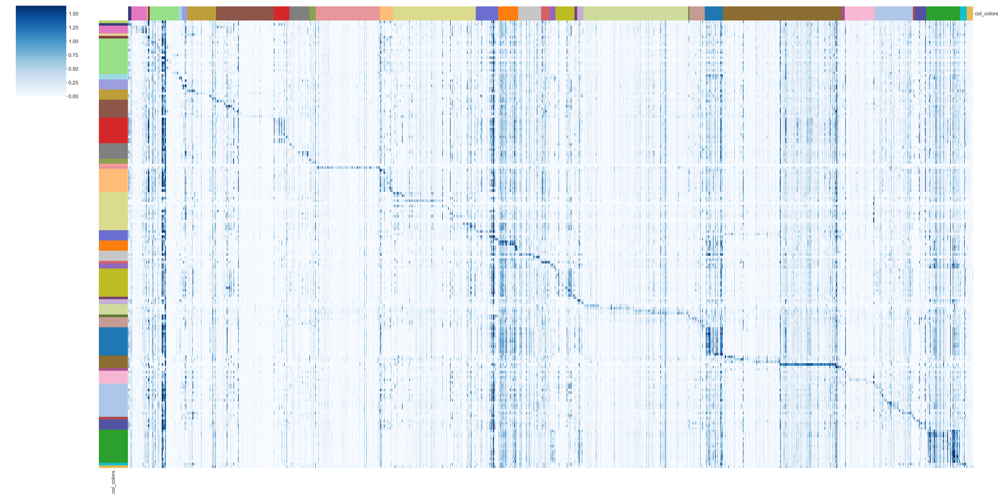

In [28]:
#genrate low rez, all gene Heat Map
# clipped at 1.0

sns.set(font_scale=2)
sns.clustermap(expr_data_plot.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               dendrogram_ratio=(.1, .01),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               vmax = np.percentile(expr_data_plot, 99.5),
               #vmin = 0.0,
               row_colors = TFcolors.col_colors,
               col_colors = Genecolormapdf.col_colors,
               yticklabels=False,
               xticklabels=False,
               figsize=(60, 30)
           )

#plt.savefig(DATA_OUT_DIR + 'Fig2LowRez.pdf')
plt.show()
plt.close()

In [29]:
# normalize in both directions
def NormTwoWays(exp_input):
    # copy the data 
    df_min_max_scaled = exp_input.copy() 
    
    # apply normalization techniques in one direction.
    for column in df_min_max_scaled.columns: 
        df_min_max_scaled[column] = (df_min_max_scaled[column] - df_min_max_scaled[column].min()) / (df_min_max_scaled[column].max() - df_min_max_scaled[column].min())  

    # copy the data again but flip
    df_min_max_scaled_flip = df_min_max_scaled.T.copy() 

    # apply normalization techniques in other direction.
    for column in df_min_max_scaled_flip.columns: 
        df_min_max_scaled_flip[column] = (df_min_max_scaled_flip[column] - df_min_max_scaled_flip[column].min()) / (df_min_max_scaled_flip[column].max() - df_min_max_scaled_flip[column].min()) 

    # unflip
    normalized_expr_data_plot = df_min_max_scaled_flip.T.copy()
    return(normalized_expr_data_plot)

In [30]:
# normalize in cell type direction
def NormOneWay(exp_input):
    # copy the data 
    df_min_max_scaled = exp_input.copy().T
    
    # apply normalization techniques in one direction.
    for column in df_min_max_scaled.columns: 
        df_min_max_scaled[column] = (df_min_max_scaled[column] - df_min_max_scaled[column].min()) / (df_min_max_scaled[column].max() - df_min_max_scaled[column].min())  

   
    return(df_min_max_scaled.T)

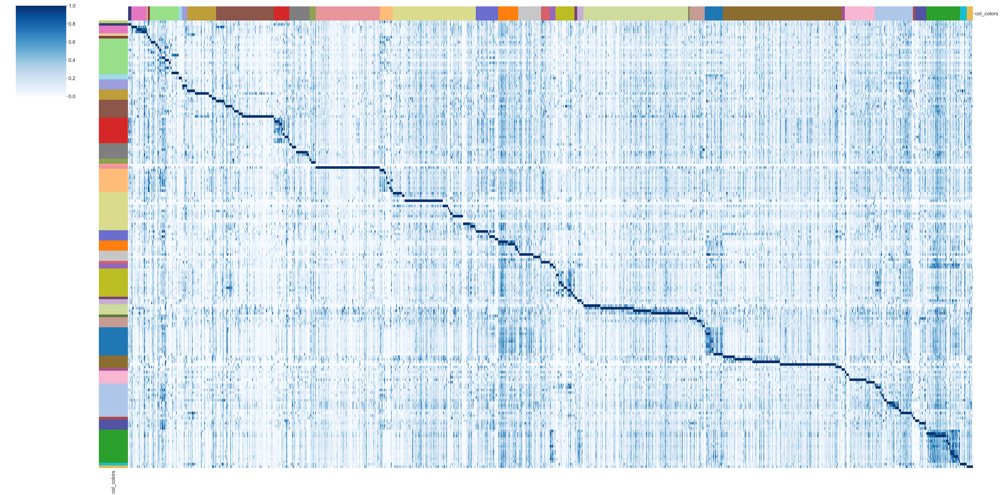

In [31]:
#normalized_expr_data_plot = NormTwoWays(expr_data_plot)
normalized_expr_data_plot = NormOneWay(expr_data_plot)
########### Dont Normalize #############
#normalized_expr_data_plot = expr_data_plot
########################################

#genrate low rez, all gene Heat Map
# this one is two-axis normalized and clipped at 1.0
sns.set(font_scale=2)
sns.clustermap(normalized_expr_data_plot.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               dendrogram_ratio=(.1, .01),  #used to position the color bar
               cmap ='Blues',
               vmax = 1.0,
               #vmin = 0.0,
               row_colors = TFcolors.col_colors,
               col_colors = Genecolormapdf.col_colors,
               yticklabels=False,
               xticklabels=False,
               figsize=(60, 30)
           )

#plt.savefig(DATA_OUT_DIR + 'Fig2LowRezNorm.pdf')
plt.show()
plt.close()


## Plot in Tau Order to highlight Ubiq genes


In [32]:
expr_data_plot

,adventitial_cell,cardiac_endothelial_cell,ciliated_epithelial_cell,lung_ciliated_cell,ciliated_columnar_cell_of_tracheobronchial_tree,conjunctival_epithelial_cell,connective_tissue_cell,bronchial_smooth_muscle_cell,myometrial_cell,tongue_muscle_cell,...,regulatory_t_cell,naive_thymus_derived_cd8_positive__alpha_beta_t_cell,naive_thymus_derived_cd4_positive__alpha_beta_t_cell,activated_cd4_positive__alpha_beta_t_cell,activated_cd8_positive__alpha_beta_t_cell,gamma_delta_t_cell,mature_nk_t_cell,t_cell,bladder_urothelial_cell,vestibular_dark_cell
ZNF366,0.002426,0.703689,0.000956,0.004422,0.001967,0.001484,0.000000,0.004761,0.000000,0.000000,...,0.000443,0.000000,0.000365,0.000000,0.000531,0.000000,0.000594,0.002176,0.000234,0.000000
TCF4,1.153490,2.719323,0.217558,0.632203,0.758354,0.185834,1.090806,0.708782,0.413074,0.992884,...,0.019492,0.013233,0.006100,0.005363,0.004585,0.031634,0.199141,0.040927,0.094741,0.073974
TCF15,0.000000,0.740034,0.001024,0.001944,0.000000,0.001006,0.000000,0.011581,0.000000,0.000000,...,0.000483,0.000000,0.000000,0.000000,0.000000,0.000000,0.000145,0.000635,0.001366,0.000000
MXD4,0.261813,0.741705,0.171419,0.291163,0.157259,0.105085,0.202761,0.418252,0.113934,0.170070,...,0.319071,0.280129,0.180442,0.155803,0.148750,0.275904,0.279192,0.195430,0.116991,0.174234
MEOX2,0.104077,0.803357,0.000000,0.002757,0.001822,0.000925,0.087054,0.221232,0.030736,0.007673,...,0.000000,0.000000,0.000070,0.000000,0.000563,0.000000,0.000413,0.001986,0.000055,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF286A,0.010331,0.012888,0.006891,0.010463,0.011073,0.019417,0.021155,0.012004,0.012620,0.001248,...,0.014616,0.019176,0.016292,0.010529,0.013460,0.013435,0.012024,0.015494,0.012487,0.098522
ZNF174,0.041309,0.040240,0.048184,0.025434,0.015983,0.008937,0.012115,0.042200,0.005405,0.034598,...,0.025128,0.015344,0.024462,0.009251,0.011458,0.013348,0.020829,0.009582,0.006529,0.073669
ZKSCAN8,0.082651,0.121837,0.044384,0.075653,0.047437,0.045407,0.159169,0.032663,0.109586,0.084084,...,0.083501,0.104383,0.081146,0.055293,0.075593,0.127492,0.118509,0.065619,0.037227,0.240413
HMX2,0.000000,0.000000,0.000000,0.000322,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000411,0.000000,0.000000,0.000486,0.000000,0.000234,0.000019,0.124764


In [33]:
#ub_expr_data_plot = expr_data_plot.loc[low_tau, :].copy()

ub_expr_data_plot = expr_data_plot.copy()
ub_expr_data_plot['tau'] = tau_values
ub_expr_data_plot.sort_values('tau', ascending = True, inplace = True)
ub_expr_data_plot = ub_expr_data_plot.drop("tau", axis='columns')
#ub_expr_data_plot
print('Min', ub_expr_data_plot.min().min())
print('Max', ub_expr_data_plot.max().max())

np.percentile(ub_expr_data_plot, 99.5)

Min 0.0
Max 4.911415


1.6455024480000005

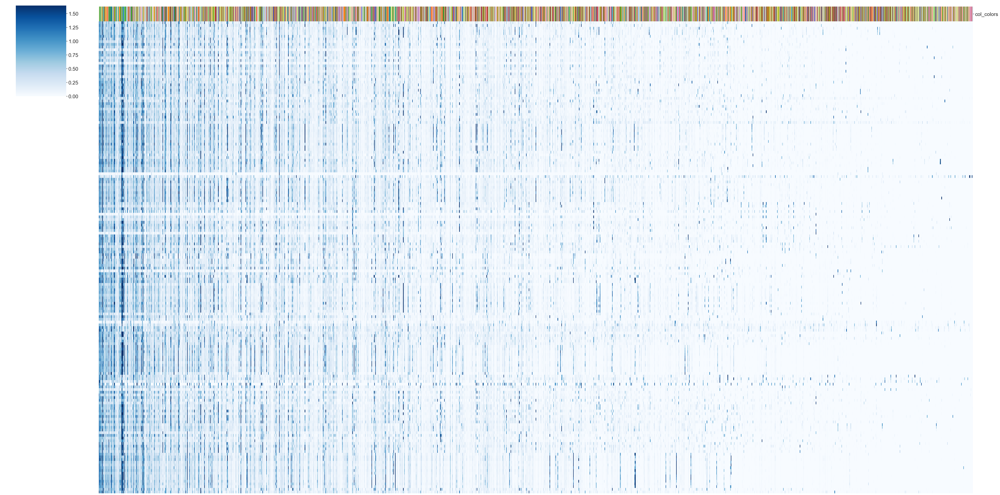

In [34]:
# clipped at 1.0
sns.set(font_scale=2)
sns.clustermap(ub_expr_data_plot.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               dendrogram_ratio=(.1, .01),  #used to position the color bar
               cmap ='Blues',
               vmax = np.percentile(ub_expr_data_plot, 99.5),
               vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               col_colors = Genecolormapdf.col_colors,
               yticklabels=False,
               xticklabels=False,
               figsize=(60, 30)
           )

plt.savefig(DATA_OUT_DIR + 'Fig2LowRezUbiqAscendingFull.pdf')
plt.show()
plt.close()

In [35]:
flip = ub_expr_data_plot.T.copy()
flipcolnames = list(flip.columns)
for i in range(0, len(flipcolnames)): 
    flipcolnames[i] = ' '
flipcolnames[100] = 100
flipcolnames[744] = 745
flip.columns = flipcolnames

# clipped at 1.0
sns.set(font_scale=2)
sns.clustermap(flip, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               dendrogram_ratio=(.1, .01),  #used to position the color bar
               cmap ='Blues',
               vmax = np.percentile(ub_expr_data_plot, 99.5),
               vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               col_colors = Genecolormapdf.col_colors,
               yticklabels=False,
               xticklabels=True,
               figsize=(60, 30)
           )

plt.savefig(DATA_OUT_DIR + 'Fig2LowRezUbiqAscendingFullWithMarkers.pdf')
plt.show()
plt.close()

## Make color key

In [36]:
# copy the color key for the broad cell types into the palette for the key
key_colors = TFcolors[ ['broadct','col_colors']].drop_duplicates()
ct_palette = key_colors.sort_values('broadct')
ct_palette = ct_palette.reset_index()
ct_palette = ct_palette.drop(['index'], axis =1)

ct_palette.to_csv(DATA_OUT_DIR + "BroadCellTypeColorPalette.csv")
ct_palette

,broadct,col_colors
0,adventitial cell,#b5cf6b
1,cardiac endothelial cell,#393b79
2,ciliated epithelial cell,#e377c2
3,conjunctival epithelial cell,#e7cb94
4,connective tissue cell,#843c39
5,contractile cell,#98df8a
6,dendritic cell,#9edae5
7,duct epithelial cell,#9c9ede
8,ecto-epithelial cell,#bd9e39
9,endo-epithelial cell,#8c564b


In [37]:
# make fake data for sns.relplot of the correct dimensions and order
fdf = expr_data_plot.T.iloc[0:len(ct_palette)]
fdf = fdf[['LHX5', 'PRRX1']]
fdf['Broad Cell Type'] = list(ct_palette.broadct)
fdf['Color Key'] = list(ct_palette.col_colors)
fdf = fdf.sort_values('Broad Cell Type', ascending = True)
fdf = fdf.reset_index()
fdf = fdf.drop('index', axis = 1)
fdf["Broad Cell Type"] = fdf["Broad Cell Type"].str.capitalize()


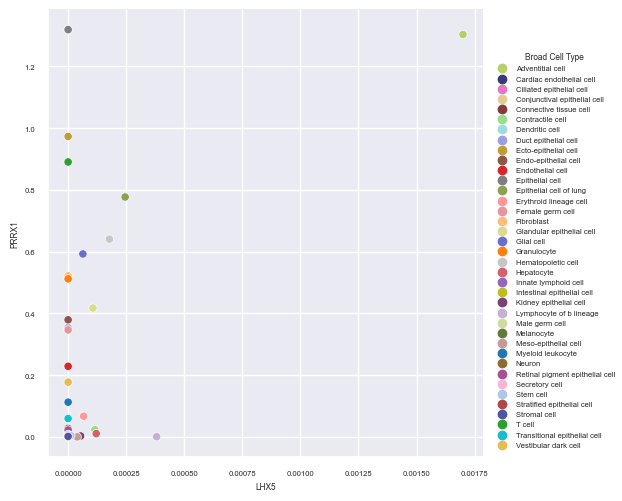

In [38]:
sns.set(font_scale=0.5)
sns.relplot(data=fdf, x="LHX5", y="PRRX1", 
            hue = fdf['Broad Cell Type'], 
            palette = list(fdf['Color Key']))

plt.savefig(DATA_OUT_DIR + 'TF_Fig2_ColorKey.pdf')
plt.show()
plt.close()


# Make subplots insets for broad cell types 

In [68]:
# make non-called out genes into ""

tlist = ['ETS1', 'FOXP3', 'IKZF1','IKZF2', 'IKZF3'] 
flist = ['TCF21', 'TBX20', 'SREBF1']
elist = ['ERG','ELK3','HEY1','FOXC2', 'LHX6', 'EPAS1', 'FLI1']
slist = ['ZIC1', 'ZIC4', 'ASCL2', 'MYF5', 'MSC','CDX1', 'CDX2', 'ONECUT2','CBX2', 'HOXA9', 'MYB', 'GATA1', 'KLF1']
mlist = ['SALL4','DMRT1', 'SOHLH1', 'MYBL1','TCFL5', 'SOX30', 'TCF3']
commonlist = ['SOX2', 'OCT4', 'NANOG', 'TBET', 'EOMES', 'MYOD' ]

glist = tlist + flist + elist + slist + mlist + commonlist

In [69]:
# prune list by tau....
hightaulist = list(tau_values.index[tau_values> 0.85])
print(len(hightaulist))

890


In [70]:
tau_values['MYBL1']

0.9505

In [71]:
high = tau_values[tau_values > 0.85]

In [72]:
def fixSuplotCellTypeLabels(expm):
    # fix cell type names
    expm.columns = expm.columns.str.capitalize()
    expm.columns = [sub.replace('_', ' ') for sub in subPlotdf.columns] 
    return(expm)

In [73]:
def fixSuplotGeneLabels(expm, glist):
    flip = expm.T
    geneSelector = flip.columns.isin(glist)
    #print('geneSelector', geneSelector)
    flipgenes = list(flip.columns)
    for i in range(len(geneSelector)):
        if ~geneSelector[i]:
            flipgenes[i] = ' '
    if flipgenes[0] == ' ': 
        flipgenes[0] = '.'
    if flipgenes[-1] == ' ':
        flipgenes[-1] = '.'    
                
    flip.columns = flipgenes
    #print(flipgenes[-1])
    expm = flip.T
    return(expm)

## T-Cell Subplot

In [74]:
## T-cell sub figure
subPlotCt = TFcolors[TFcolors.broadct == 't cell']
y = list(subPlotCt.index)
x = Genecolormapdf.ctypes.isin(y)
subPlotdf = expr_data_plot.loc[x, y]

# fix up cell type names
subPlotdf = fixSuplotCellTypeLabels(subPlotdf)
subPlotdf

,Cd8 positive alpha beta t cell,Cd8 positive alpha beta thymocyte,Thymocyte,Cd4 positive alpha beta t cell,Cd4 positive alpha beta thymocyte,Regulatory t cell,Naive thymus derived cd8 positive alpha beta t cell,Naive thymus derived cd4 positive alpha beta t cell,Activated cd4 positive alpha beta t cell,Activated cd8 positive alpha beta t cell,Gamma delta t cell,Mature nk t cell,T cell
BHLHE23,0.000000,0.004011,0.000000,0.000036,0.002493,0.000000,0.000782,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ZNF496,0.063760,0.749837,0.411630,0.053355,0.139978,0.033608,0.201324,0.063890,0.061997,0.080792,0.093557,0.091755,0.053983
ZNF718,0.163687,0.484351,0.262242,0.131618,0.161739,0.127026,0.231987,0.144090,0.111641,0.130051,0.112296,0.232976,0.118816
BCL11B,1.378657,2.159685,1.503780,1.660047,1.670120,1.698954,1.786502,1.883697,1.408874,1.250128,0.866052,0.341035,1.541669
ZNF589,0.109189,0.305964,0.255874,0.114563,0.123354,0.106095,0.133978,0.110463,0.113661,0.133506,0.149456,0.094683,0.127548
...,...,...,...,...,...,...,...,...,...,...,...,...,...
IKZF2,0.426843,0.647382,1.672216,0.307236,0.175970,1.324124,0.120616,0.185952,0.048957,0.109281,1.812233,0.488423,0.427059
FOSL2,0.577556,0.402574,0.128848,0.376253,0.445077,0.350737,0.654984,0.339797,0.794011,0.803446,1.085095,1.103820,0.571023
EOMES,0.245430,0.003493,0.020498,0.024980,0.004086,0.004547,0.111723,0.011410,0.029039,0.022178,0.007082,0.348313,0.022667
MECP2,0.839337,0.720677,0.844012,0.821702,0.690345,0.877054,0.979533,0.830121,0.854837,0.878374,0.918390,0.790806,1.139253


In [75]:
# clipped at 
sns.set(font_scale=6)
sns.clustermap(subPlotdf.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(120, 60)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotTcell.pdf')
plt.show()
plt.close()

In [76]:
subPlotdfhigh = fixSuplotGeneLabels(subPlotdf, hightaulist)

# clipped at 
sns.set(font_scale=7)
sns.clustermap(subPlotdfhigh.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(120, 60)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotTcellHigh.pdf')
plt.show()
plt.close()

In [77]:
subPlotdffav = fixSuplotGeneLabels(subPlotdf, glist)

sns.set(font_scale=7)
sns.clustermap(subPlotdffav.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(120, 60)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotTcellFav.pdf')
plt.show()
plt.close()

## Fibroblast-Cell Subplot

In [78]:
## Fibroblast sub figure
subPlotCt = TFcolors[TFcolors.broadct == 'fibroblast']
y = list(subPlotCt.index)
x = Genecolormapdf.ctypes.isin(y)
subPlotdf = expr_data_plot.loc[x, y]

# fix up cell type names
subPlotdf = fixSuplotCellTypeLabels(subPlotdf)
subPlotdf

,Fibroblast of breast,Keratocyte,Hepatic stellate cell,Pancreatic stellate cell,Thymic fibroblast type 1,Alveolar type 2 fibroblast cell,Fibroblast,Fibroblast of cardiac tissue,Thymic fibroblast type 2
TWIST2,1.569251,0.615089,0.042430,0.259054,0.724100,0.667958,1.011280,0.430503,0.909448
CEBPB,2.356595,0.856098,0.676071,1.737178,1.302916,1.727980,1.556689,0.646944,1.144153
HIVEP2,1.637565,0.793647,0.530455,0.480376,0.577625,0.748629,0.843521,0.542513,0.716619
RFX8,0.862663,0.022948,0.018448,0.034858,0.052792,0.074047,0.069326,0.024619,0.023010
ZNF146,0.521863,0.237339,0.139292,0.279867,0.202374,0.210842,0.219066,0.257519,0.210301
PRRX2,0.511633,0.314221,0.015855,0.183422,0.248760,0.148199,0.353521,0.129090,0.325294
TSHZ3,0.642858,0.234713,0.146059,0.302949,0.228666,0.431496,0.310793,0.439994,0.191930
ZNF469,0.132251,0.012200,0.006129,0.002522,0.021651,0.010687,0.023433,0.010391,0.047347
PRRX1,1.910932,1.648397,0.074747,0.601556,1.111383,0.892815,0.977290,0.687495,1.105145
NFIX,0.390513,1.090424,0.390755,0.496373,0.736935,0.642716,0.688955,1.041120,0.972077


In [1]:
# clipped at 
sns.set(font_scale=6)
sns.clustermap(subPlotdf.T, 
               row_cluster=True, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(50, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotFibroblast.pdf')
plt.show()
plt.close()

NameError: name 'sns' is not defined

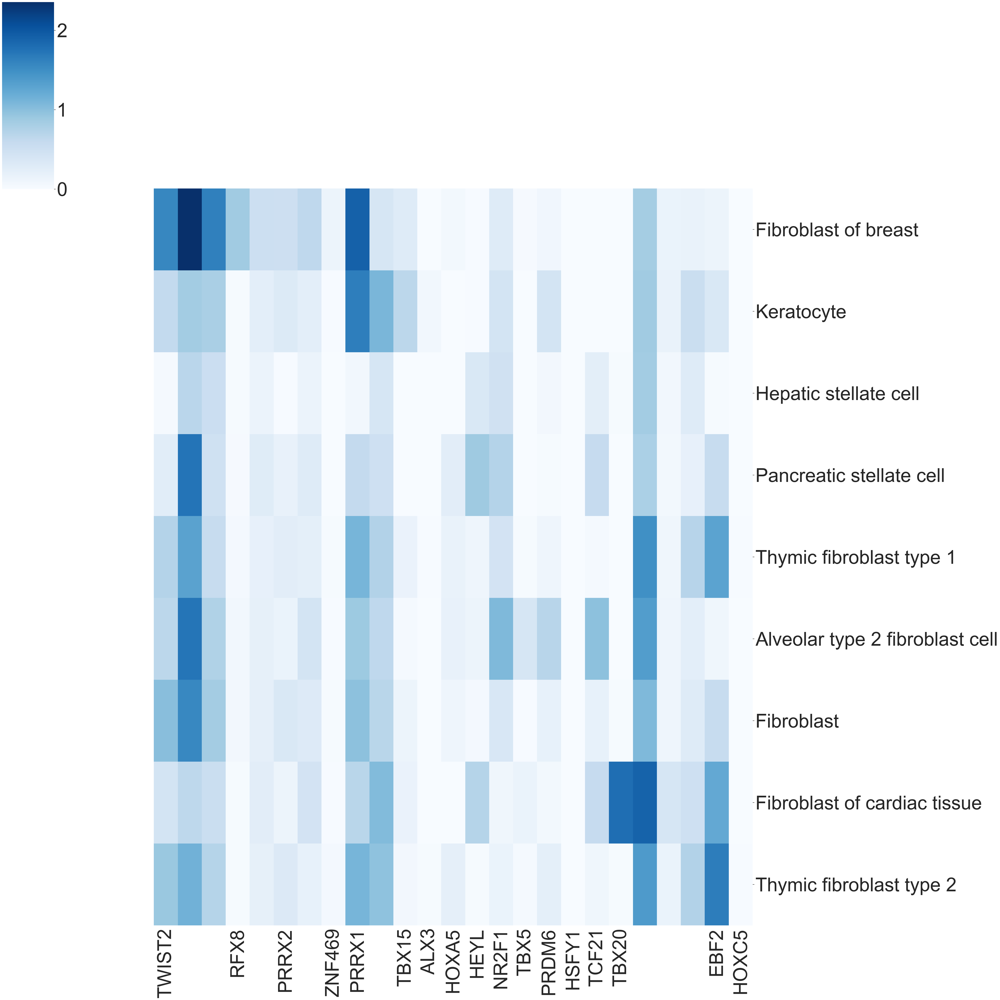

In [80]:
subPlotdfhigh = fixSuplotGeneLabels(subPlotdf, hightaulist)

# clipped at 
sns.set(font_scale=6)
sns.clustermap(subPlotdfhigh.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(50, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotFibroblastHigh.pdf')
plt.show()
plt.close()

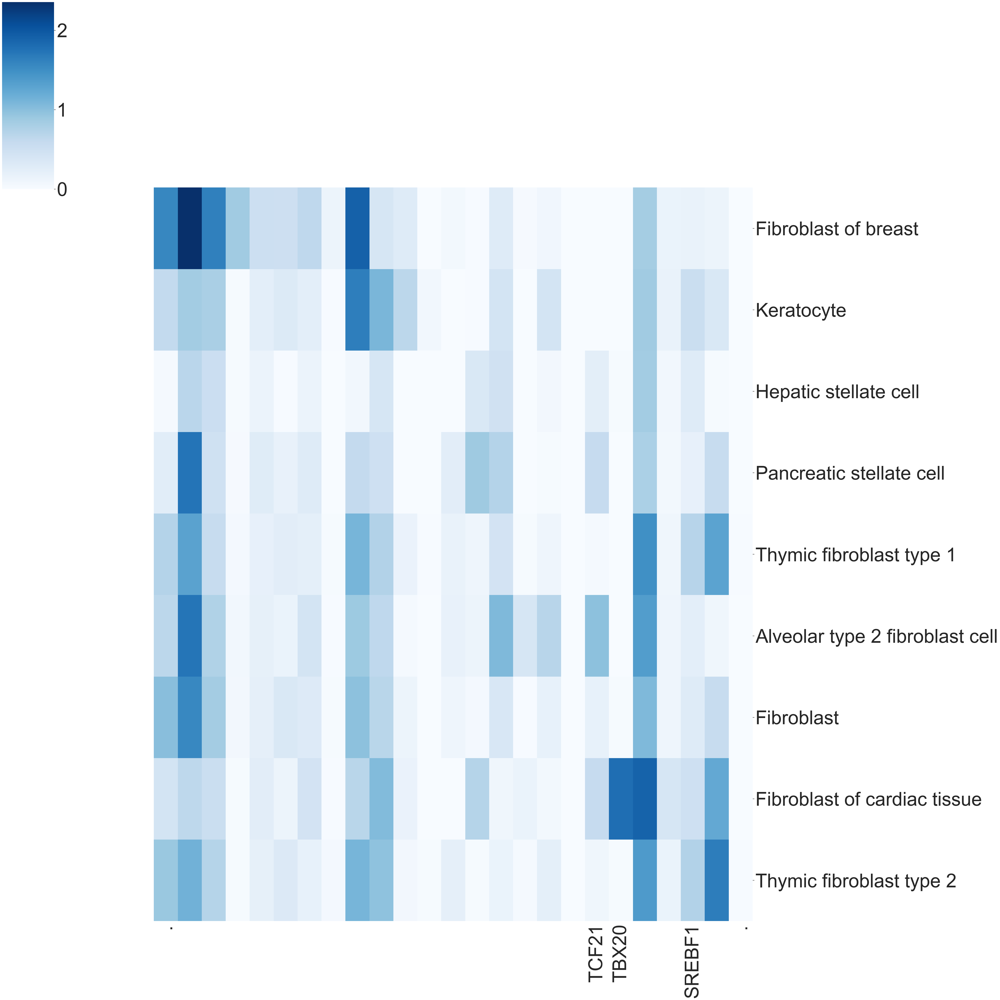

In [81]:
subPlotdffav = fixSuplotGeneLabels(subPlotdf, glist)

# clipped at 
sns.set(font_scale=6)
sns.clustermap(subPlotdffav.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(50, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotFibroblastFav.pdf')
plt.show()
plt.close()

## Endothelial Cell Subplot

In [82]:
## Endothelial cell sub figure
subPlotCt = TFcolors[TFcolors.broadct == 'endothelial cell']
y = list(subPlotCt.index)
x = Genecolormapdf.ctypes.isin(y)
subPlotdf = expr_data_plot.loc[x, y]

# fix up cell type names
subPlotdf = fixSuplotCellTypeLabels(subPlotdf)
subPlotdf

,Endothelial cell of artery,Endothelial cell of arteriole,Endothelial cell of venule,Retinal blood vessel endothelial cell,Colon endothelial cell,Capillary endothelial cell,Endothelial cell of lymphatic vessel,Endothelial cell of vascular tree,Vein endothelial cell,Endothelial cell
EPAS1,3.236861,2.841956,2.330765,2.205184,2.153887,3.058272,1.156846,0.452433,2.487201,1.989866
HEY1,0.719776,0.388311,0.033314,0.108695,0.125085,0.317952,0.089700,0.095607,0.050456,0.214639
BCL6B,0.168542,0.311041,0.198356,0.140455,0.198832,0.209557,0.138010,0.000000,0.140094,0.199464
ZNF442,0.072201,0.195055,0.124354,0.042174,0.105593,0.086127,0.032253,0.039959,0.059222,0.067107
HLX,0.176442,0.300364,0.042717,0.090369,0.126204,0.148467,0.022146,0.017695,0.113499,0.175068
NKX2-3,0.000835,0.622793,0.420420,0.000000,0.306194,0.000371,0.012330,0.000000,0.000327,0.055529
HOXB4,0.101229,0.339115,0.320979,0.001583,0.227627,0.114040,0.102066,0.000000,0.132346,0.144929
SNAI1,0.189569,0.334551,0.093797,0.127298,0.267578,0.280465,0.070220,0.105223,0.300082,0.307859
PCGF2,0.355727,0.531481,0.296192,0.193240,0.279921,0.274489,0.224136,0.082524,0.327554,0.273615
KLF11,0.356497,0.587318,0.340192,0.265235,0.414811,0.369797,0.267893,0.126678,0.347212,0.321935


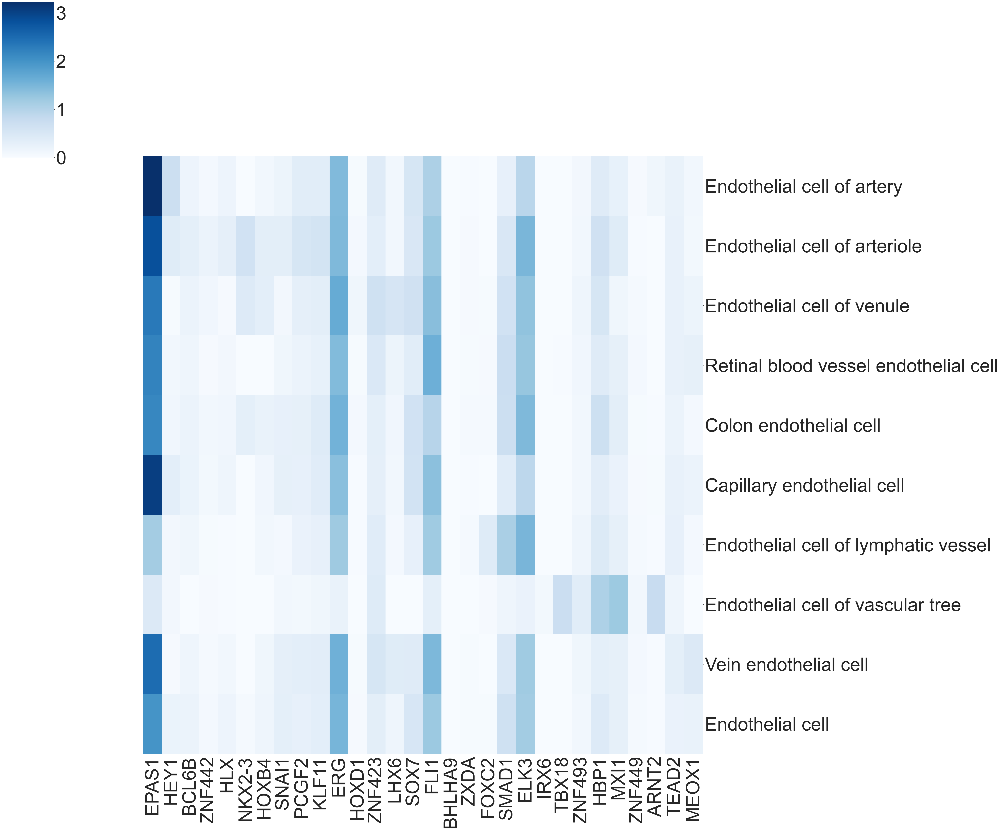

In [83]:
# clipped at 
sns.set(font_scale=7)
sns.clustermap(subPlotdf.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(60, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotEndo.pdf')
plt.show()
plt.close()

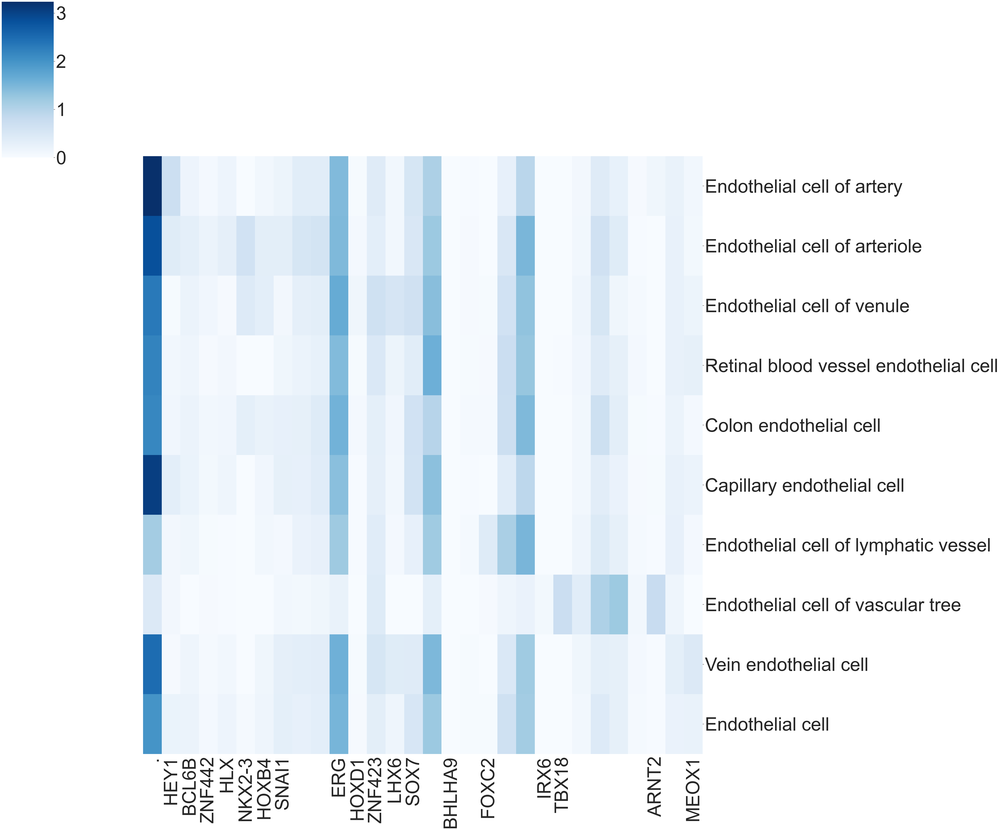

In [84]:
subPlotdfhigh = fixSuplotGeneLabels(subPlotdf, hightaulist)

# clipped at 
sns.set(font_scale=7)
sns.clustermap(subPlotdfhigh.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(60, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotEndoHigh.pdf')
plt.show()
plt.close()

In [85]:
subPlotdffav = fixSuplotGeneLabels(subPlotdf, elist)

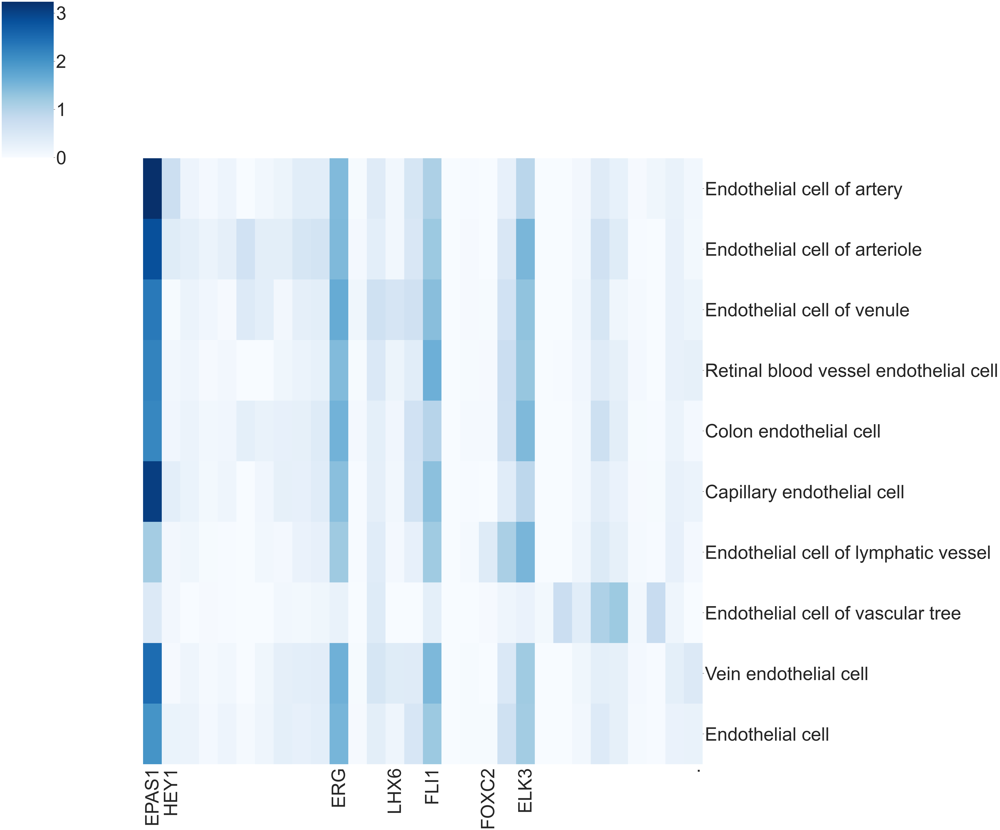

In [86]:
# clipped at 
sns.set(font_scale=7)
sns.clustermap(subPlotdffav.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(60, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotEndoFav.pdf')
plt.show()
plt.close()

## Stem Cell Subplot

In [87]:
## Stem cell sub figure
subPlotCt = TFcolors[TFcolors.broadct == 'stem cell']
y = list(subPlotCt.index)
x = Genecolormapdf.ctypes.isin(y)
subPlotdf = expr_data_plot.loc[x, y]

# fix up cell type names
subPlotdf = fixSuplotCellTypeLabels(subPlotdf)
subPlotdf

,Intestinal crypt stem cell of small intestine,Transit amplifying cell of small intestine,Mesenchymal stem cell,Transit amplifying cell of colon,Skeletal muscle satellite stem cell,Mesenchymal stem cell of adipose tissue,Basal cell of prostate epithelium,Erythroid progenitor cell,Common myeloid progenitor,Hematopoietic stem cell,Progenitor cell of mammary luminal epithelium,Radial glial cell,Intestinal crypt stem cell of colon
ASCL2,0.661584,0.034264,0.001044,0.062384,0.000117,0.015955,0.188755,0.002473,0.005492,0.033780,0.002789,0.067278,0.063336
PLAGL2,0.297810,0.209688,0.050723,0.141963,0.101708,0.032123,0.102760,0.102484,0.092324,0.061012,0.069582,0.073318,0.221088
BATF2,0.078391,0.143752,0.009425,0.026740,0.009923,0.004601,0.055203,0.000442,0.000687,0.009025,0.002896,0.000000,0.037695
ZNF830,0.117955,0.304004,0.082303,0.130300,0.152538,0.090813,0.167154,0.150618,0.162690,0.141488,0.138124,0.113582,0.103276
ONECUT2,0.747031,0.917303,0.000093,0.003298,0.001822,0.000251,0.001915,0.000420,0.000259,0.002061,0.002246,0.000000,0.003685
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SMAD3,0.639797,0.850042,1.086396,0.328561,0.812534,0.908238,0.721125,0.354730,0.759445,0.605181,0.724997,1.850311,0.346627
TGIF1,0.507827,0.423649,0.399383,0.492155,0.765035,0.268058,0.683149,0.227259,0.191440,0.172691,0.492871,0.906907,0.556081
ZNF324,0.021035,0.024512,0.030227,0.019819,0.032771,0.043313,0.043551,0.051265,0.045456,0.046806,0.057450,0.149434,0.034397
CDX2,0.333528,0.357297,0.000000,0.497892,0.000000,0.000000,0.000491,0.000000,0.000000,0.000732,0.000000,0.000000,0.709896


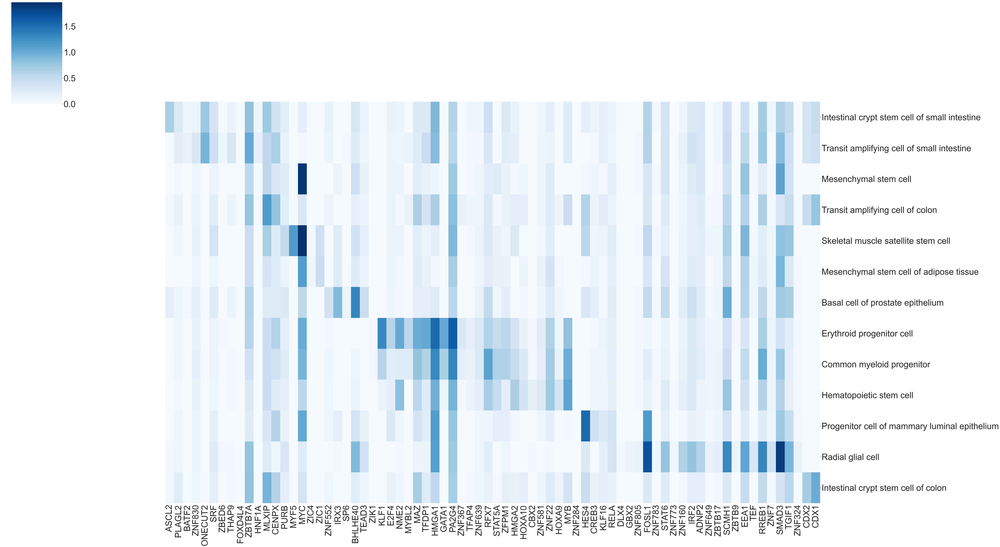

In [88]:
# clipped at 
sns.set(font_scale=5)
sns.clustermap(subPlotdf.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(90, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotStem.pdf')
plt.show()
plt.close()

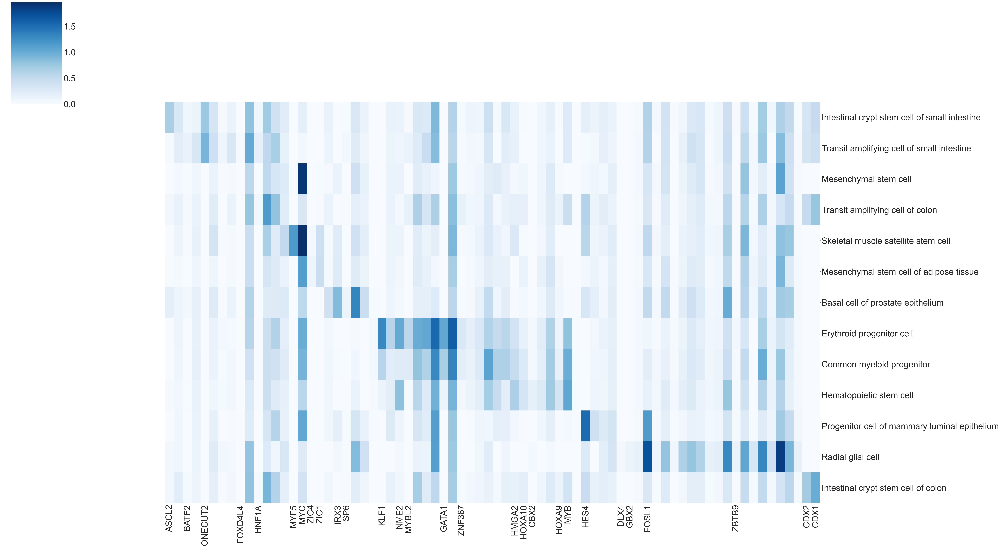

In [89]:
subPlotdfhigh = fixSuplotGeneLabels(subPlotdf, hightaulist)

# clipped at 
sns.set(font_scale=5)
sns.clustermap(subPlotdfhigh.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(90, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotStemHigh.pdf')
plt.show()
plt.close()

In [61]:
# next few cells are to confirm expression of ZIC1, ZIC4, AND MYF5 
# in fat stem cells as described in the text and figures.

In [90]:
TF_df.loc[ : , 'MYF5'].sort_values().tail(10)

capillary_endothelial_cell                 0.002525
tendon_cell                                0.003119
pericyte                                   0.003186
mesenchymal_stem_cell_of_adipose_tissue    0.003661
keratocyte                                 0.007951
slow_muscle_cell                           0.009795
mesenchymal_stem_cell                      0.010738
fast_muscle_cell                           0.012618
tongue_muscle_cell                         0.641665
skeletal_muscle_satellite_stem_cell        1.152717
Name: MYF5, dtype: float64

In [91]:
TF_df.loc[ : , 'ZIC1'].sort_values().tail(5)

endothelial_cell_of_vascular_tree          0.312046
hepatocyte                                 0.321571
stromal_cell                               0.369566
skeletal_muscle_satellite_stem_cell        0.428665
mesenchymal_stem_cell_of_adipose_tissue    0.450704
Name: ZIC1, dtype: float64

In [92]:
TF_df.loc[ : , 'ZIC4'].sort_values().tail(5)

skeletal_muscle_satellite_stem_cell        0.041035
eye_photoreceptor_cell                     0.042161
endothelial_cell_of_vascular_tree          0.050743
stromal_cell                               0.066417
mesenchymal_stem_cell_of_adipose_tissue    0.088285
Name: ZIC4, dtype: float64

In [95]:
TF_df.loc[ : , 'MYB'].sort_values().tail(10)

intestinal_crypt_stem_cell_of_colon                0.372923
ciliated_columnar_cell_of_tracheobronchial_tree    0.385812
transit_amplifying_cell_of_colon                   0.446632
ciliated_epithelial_cell                           0.478240
thymocyte                                          0.517920
lung_ciliated_cell                                 0.569059
hematopoietic_precursor_cell                       0.666860
erythroid_progenitor_cell                          0.805376
common_myeloid_progenitor                          0.986079
hematopoietic_stem_cell                            1.053068
Name: MYB, dtype: float64

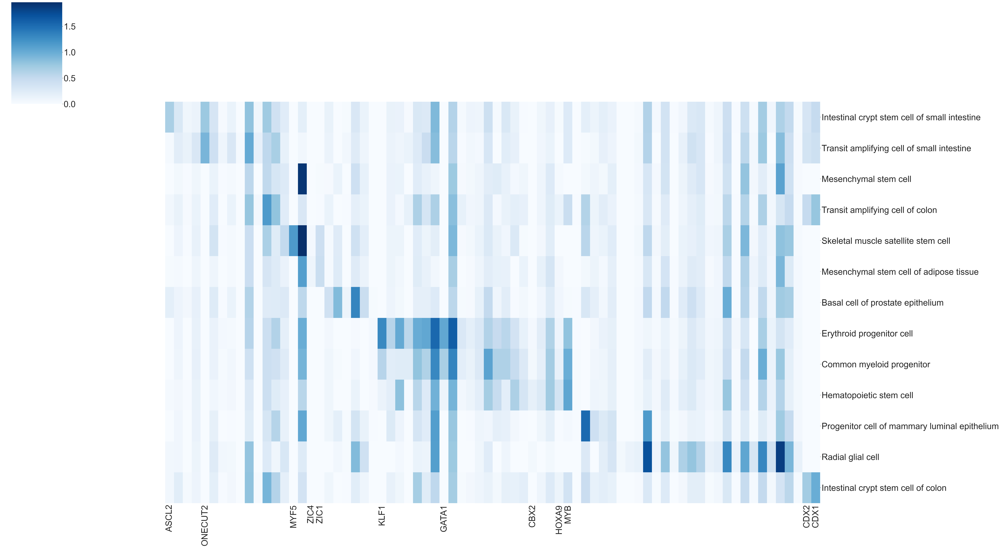

In [96]:
subPlotdfav = fixSuplotGeneLabels(subPlotdf, glist)

# clipped at 
sns.set(font_scale=5)
sns.clustermap(subPlotdfav.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,
               yticklabels=True,
               xticklabels=True,
               figsize=(90, 50)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotStemFav.pdf')
plt.show()
plt.close()

## Male Germ Cell Subplot

In [97]:
## Male germ cell sub figure
subPlotCt = TFcolors[TFcolors.broadct == 'male germ cell']
y = list(subPlotCt.index)
x = Genecolormapdf.ctypes.isin(y)
subPlotdf = expr_data_plot.loc[x, y]

# fix up cell type names
subPlotdf = fixSuplotCellTypeLabels(subPlotdf)
subPlotdf

,Spermatid,Spermatocyte,Male germ cell,Spermatogonium
SEBOX,0.005866,0.000509,0.000000,0.000000
HSFY2,0.004133,0.000542,0.000000,0.000000
THAP2,0.588415,0.256366,0.026184,0.021040
THAP5,0.621473,0.372648,0.199674,0.298389
HSFX2,0.001517,0.000285,0.000000,0.000000
...,...,...,...,...
ZNF70,0.004946,0.019383,0.018499,0.105047
YY2,0.000000,0.008031,0.067964,0.243774
SAFB,0.006978,0.285149,0.603120,0.940268
ZNF711,0.000000,0.038043,0.190853,0.685315


In [ ]:
# clipped at 
sns.set(font_scale=4)
sns.clustermap(subPlotdf.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,0
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,               
               yticklabels=True,
               xticklabels=True,
               figsize=(200, 40)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotMale.pdf')
plt.show()
plt.close()

In [99]:
# save for later tf lookup
malectTfDf = subPlotdf

In [100]:
#look up some genes
mbtgs = len(malectTfDf.index)
print('How many TF in male germ subplot?', mbtgs)
mbtgsTau = tau_values[malectTfDf.index]
specTaumg = mbtgsTau[mbtgsTau > 0.85]
print('How many are Tau >0.85?',len(specTaumg))
print('Percent  Tau >0.85?',len(specTaumg)/mbtgs*100)
TFofInterest = 'DMRT1'
print('Tau of', TFofInterest, '=', mbtgsTau.loc[TFofInterest] )

Zee = 'Z'
zincs = [idx for idx in list(malectTfDf.index) if idx.startswith(Zee)]
print('Number of Zinc Finger all male germ cell TFs', len(zincs))
print('Percent Zinc Finger of all male germ cell TFs', len(zincs)/mbtgs*100)


zincs = [idx for idx in list(specTaumg.index) if idx.startswith(Zee)]
print('Number of Zinc Finger SPECIFIC male germ cell TFs', len(zincs))
print('Percent  Zinc Finger SPECIFIC of SPECIFIC male germ cell TFs', len(zincs)/len(specTaumg)*100)

How many TF in male germ subplot? 203
How many are Tau >0.85? 114
Percent  Tau >0.85? 56.15763546798029
Tau of DMRT1 = 0.9879
Number of Zinc Finger all male germ cell TFs 109
Percent Zinc Finger of all male germ cell TFs 53.69458128078818
Number of Zinc Finger SPECIFIC male germ cell TFs 58
Percent  Zinc Finger SPECIFIC of SPECIFIC male germ cell TFs 50.877192982456144


In [ ]:
subPlotdfhigh = fixSuplotGeneLabels(subPlotdf, hightaulist)

# clipped at 
sns.set(font_scale=4)
sns.clustermap(subPlotdfhigh.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,0
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,               
               yticklabels=True,
               xticklabels=True,
               figsize=(200, 40)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotMaleHigh.pdf')
plt.show()
plt.close()

In [105]:
TF_df.loc[ : , 'SALL4'].sort_values().tail(10)

neuro_medullary_thymic_epithelial_cell    0.050515
oocyte                                    0.052113
pulmonary_ionocyte                        0.059523
pancreatic_a_cell                         0.065132
taste_receptor_cell                       0.079506
ventricular_cardiac_muscle_cell           0.080480
pancreatic_ductal_cell                    0.083921
peritubular_myoid_cell                    0.091223
regular_atrial_cardiac_myocyte            0.091493
male_germ_cell                            0.127465
Name: SALL4, dtype: float64

In [112]:
TF_df.loc[ : , 'MYBL1'].sort_values().tail(10)

langerhans_cell                                         0.213737
gamma_delta_t_cell                                      0.261718
spermatocyte                                            0.360803
t_cell                                                  0.410820
activated_cd4_positive__alpha_beta_t_cell               0.430561
cd8_positive__alpha_beta_t_cell                         0.586281
activated_cd8_positive__alpha_beta_t_cell               0.611463
mature_nk_t_cell                                        0.655075
naive_thymus_derived_cd8_positive__alpha_beta_t_cell    0.772611
natural_killer_cell                                     0.911164
Name: MYBL1, dtype: float64

In [ ]:
subPlotdffav = fixSuplotGeneLabels(subPlotdf, glist)

# clipped at 
sns.set(font_scale=4)
sns.clustermap(subPlotdffav.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,0
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,               
               yticklabels=True,
               xticklabels=True,
               figsize=(200, 40)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubPlotMaleFav.pdf')
plt.show()
plt.close()

In [ ]:
# broken up version for supllementaal figure
y = list(subPlotCt.index)
y

In [ ]:
x = Genecolormapdf.ctypes.isin(['spermatogonium'])
GoniumSubPlotdf = expr_data_plot.loc[x, y]

x = Genecolormapdf.ctypes.isin(['male_germ_cell'])
MGCSubPlotdf = expr_data_plot.loc[x, y]

x = Genecolormapdf.ctypes.isin(['spermatid'])
StidSubPlotdf = expr_data_plot.loc[x, y]

x = Genecolormapdf.ctypes.isin(['spermatocyte'])
ScyteSubPlotdf = expr_data_plot.loc[x, y]



In [ ]:
print(GoniumSubPlotdf.shape)
xdim = GoniumSubPlotdf.shape[0]
sns.set(font_scale=4)
sns.clustermap(GoniumSubPlotdf.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,0
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,               
               yticklabels=True,
               xticklabels=True,
               figsize=(xdim, 20)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubGonium.pdf')
plt.show()
plt.close()

In [ ]:
print(MGCSubPlotdf.shape)
xdim = MGCSubPlotdf.shape[0]
sns.set(font_scale=4)
sns.clustermap(MGCSubPlotdf.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,0
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,               
               yticklabels=True,
               xticklabels=True,
               figsize=(xdim, 20)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubMGC.pdf')
plt.show()
plt.close()

In [ ]:
print(StidSubPlotdf.shape)
xdim = MGCSubPlotdf.shape[0]
sns.set(font_scale=4)
sns.clustermap(StidSubPlotdf.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,0
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,               
               yticklabels=True,
               xticklabels=True,
               figsize=(xdim, 20)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubStid.pdf')
plt.show()
plt.close()

In [ ]:
print(ScyteSubPlotdf.shape)
xdim = ScyteSubPlotdf.shape[0]
sns.set(font_scale=4)
sns.clustermap(ScyteSubPlotdf.T, 
               row_cluster=False, 
               col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.2, .1),  #used to position the color bar
               cmap ='Blues',
               #vmax = 1.0,0
               #vmin = 0.0,
               #row_colors = TFcolors.col_colors,
               #col_colors = Genecolormapdf.col_colors,               
               yticklabels=True,
               xticklabels=True,
               figsize=(xdim, 20)
           )
plt.savefig(DATA_OUT_DIR + 'Fig2SubScyte.pdf')
plt.show()
plt.close()

## Make Ubiq Gene labels

In [ ]:
####### perhaps not needed, replaced by fixSuplotGeneLabels
def MakeBlankOutLabels(expdat, glist):
    expdat = expdat.T
    nameSelector = ~expdat.columns.isin(glist)
    
    exdatIndices = pd.DataFrame()
    exdatIndices['Gene'] = glist
    glistIndex = []

    for i in range(0,len(glist)):
        glistIndex.append(expdat.columns.tolist().index(glist[i]))
    exdatIndices['Location'] = glistIndex

    return(exdatIndices.sort_values('Location'))



In [ ]:
# sort expression data by tau
sortdf = pd.DataFrame(tau_values)
sortdf.sort_index(inplace = True)

TF_tau_order_data = expr_data_plot.copy().sort_index()
TF_tau_order_data['tau'] = sortdf[0]
TF_tau_order_data.sort_values('tau', inplace = True, ascending = True)
TF_tau_order_data.drop('tau', axis = 1, inplace = True)

In [ ]:
TF_tau_order_data

In [ ]:
ChatGPTgenes = [ 'SP1', 'NFKB1', 'NFKB2', 'JUN', 'FOS', 'FOSB', 'JUNB', 'JUND', 'FOSL1', 'FOSL2',
                'CREB1', 'CREB5', 'NRF1', 'MYC', 'STAT3', 'E2F1', 'TP53', 'EGR1', 'POU5F1', 'SOX2',
                'GATA1', 'CEBPA', 'HNF4A', 'FOXO1', 'SMAD3', 'SREBF1', 'NFE2L2' ]  # 'SMAD2' 

ACTBnGAPDH_TFs = ['SP1','NFYB', 'CTCF']   #'TBF', 'LK', 
Antoines_TFs = ['UBTF','TAF1A','TAF1B','TAF1C','TAF1D','TTF1','TBP','GTF2B','TAF2','ABT1','BRF1','GTF3A','GTF3C1']
Sandys_TFs = ['TFEB', 'SRF'] #, 'PF2D', 'GTF2D', 'TPB'
MiscGenes = ACTBnGAPDH_TFs + Sandys_TFs + Antoines_TFs 

LowTau20genes = low_tau[-20:]

AnotherChatGPTgeneset = ['ATF1', 'BPTF', 'ZBTB44', 'TP53', 'MTF2',          #'ZFP57', 
           'ZNF786', 'DMTF1','CGGBP1', 'NFATC3', 'ZNF195',  #'IKZF1', 
           'ZBTB1', 'SOX4']

ubgenes = ChatGPTgenes

In [ ]:
ubgenes

In [ ]:
Ub_plot_data = fixSuplotGeneLabels(TF_tau_order_data, ubgenes)
Ub_plot_data

In [ ]:
#sns.clustermap(expr_data_plot, col_cluster=False, col_colors=col_colors)
sns.set(font_scale=2)
sns.clustermap(Ub_plot_data.T, 
               row_cluster=False, col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.1, .02),
               cmap ='Blues',
               vmax = np.percentile(ub_expr_data_plot, 99.5),
               vmin = 0.0,
               row_colors = TFcolors.col_colors,
               xticklabels=True,
               figsize=(60, 30)
           )

plt.savefig(DATA_OUT_DIR + 'plotheatmapCommonUbiq.pdf')
plt.show()
plt.close()




In [ ]:
# make version that denotes 100 lowest and 744 cutoff for figure
flip = TF_tau_order_data.T.copy()
flipcolnames = list(flip.columns)
for i in range(0, len(flipcolnames)): 
    flipcolnames[i] = ' '
flipcolnames[100] = 100
flipcolnames[744] = 744
flip.columns = flipcolnames

In [ ]:
#sns.clustermap(expr_data_plot, col_cluster=False, col_colors=col_colors)
sns.set(font_scale=2)
sns.clustermap(flip, 
               row_cluster=False, col_cluster=False,
               #optimal_ordering=True,
               #dendrogram_ratio=(.1, .02),
               cmap ='Blues',
               vmax = np.percentile(ub_expr_data_plot, 99.5),
               vmin = 0.0,
               row_colors = TFcolors.col_colors,
               xticklabels=True,
               figsize=(60, 30)
           )

plt.savefig(DATA_OUT_DIR + 'plotheatmapBlankNames100n744.pdf')
plt.show()
plt.close()

In [ ]:
###########################################################

In [ ]:
### do developmental genes show up in our dataset
#TF_dev = pd.read_csv(DATA_IN_DIR+'DevOnlyTFsChatGPT.csv')
#print('Every one of these is in our adult data!')
#TF_exp[TF_exp.index.isin(TF_dev.TF_Name)]
#TF_dev[~TF_dev.DevTFname.isin(TF_exp.index)]
#TF_dev.TF_Name

In [ ]:
################### test code for tau ######################
expressionOfSon = TF_exp.loc[ 'SON']
NormexpressionOfSon = expressionOfSon/max(expressionOfSon)
OneMinusArray = 1 - NormexpressionOfSon
tauOfSon = sum(OneMinusArray) / (len(OneMinusArray) - 1)
tauOfSon
################### Hah! my own Tau computation works ########